# Description
- Rerun older model runs but with detrending applied to train and test set separately
- Chosen models as in rf009
    - rf004 run_id3 (tp, u10)
    - rf005 run_id2 (sp timelag3)
    - rf005 run_id12 (u10 timelag3)
    - rf006 run_id14 (u10, timelag2,3)
- Implement predictor map plot in model run
- Check if predictors are on same scale for range of years 1999-2008 and 2009-2018 
    a: They are.

# ToDO
- Runs 0 - 3: Old models but with hyperparameter settings from rf008
    - Did not work well. Testcfm is 0% for most of them
    --> Check the run again. Done:Should be fine
- Runs 4 - 7: rf008 hparams and rest of rf004 predictors
- Run 8: Testrun with exact same params and old detrending, e.g. detrend gesla dataset first, then train-test split! just to ccheck if run is really fine. Used run: rf006 run_id14
    - Result: 
        - CFM shows the same results as before, 80.77%.
        - Predictor Map look same
        - Importance Map look same
        - Conclusion: Run is fine as it is. Results can be interpreted normally.
- If run is fine: 
    - upnext: Repeat the runs 0-3 but choose hparams for each run as they were in old runs and apply detrend after train-test split (done)
- Interpret results (done)
    

# Working Area

In [1]:
# Modules
import numpy as np
import xarray as xr
import pandas as pd
import pickle
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler


from data import data_loader
from data import gesla_preprocessing
from data import era5_preprocessing
from data import preprocessing
from data import saver
from data import visualisation

from models import modelfit
from models import evaluation
from models import loader

In [2]:
#--- 
# Initialize
#---
model_run = "rf011"
preprocess = "preprocess1" # ["preprocess1"]
range_of_years = "1999-2008" # ["1999-2008", "2009-2018", "2019-2022",] 
subregion = "lon-0530_lat7040" # ["lon-0530_lat7040"]
season = "winter" # ["winter", "autumn",] 
percentile = 0.95 # [0.95, 0.99,] 
station_names = ["hanko-han-fin-cmems",]

In [3]:
#---
# Preprocess GESLA Data
# without Detrending.
#---

# Load Predictand
#---
gesla_predictand = data_loader.load_gesla(station_names)

# Select a season
#---
gesla_predictand = gesla_preprocessing.select_season(gesla_predictand, season)

# Select only sea_level analysis data
#---
gesla_predictand = gesla_preprocessing.get_analysis(gesla_predictand)
gesla_predictand = gesla_predictand["sea_level"] # Select values

# # Detrend
# # ---
# gesla_predictand = gesla_preprocessing.detrend(gesla_predictand, level="station")

# # Apply one hot encoding
# #---
# gesla_predictand = gesla_preprocessing.apply_dummies(gesla_predictand, percentile=percentile, level="station")
# print(f"Applied one-hot-encoding with Percentile: {percentile}")

# Convert to DataArray
# nan values: no measurement at that timestamp for specific station
#---
gesla_predictand = gesla_predictand.to_xarray()
gesla_predictand

Load Predictand from GESLA


<xarray.DataArray 'sea_level' (station: 1, date_time: 106357)>
array([[ 0.201,  0.221,  0.215, ..., -0.057, -0.06 , -0.057]])
Coordinates:
  * station    (station) int64 0
  * date_time  (date_time) datetime64[ns] 1971-01-01 ... 2020-12-17T07:00:00

In [4]:
#---
# Define predictors of each model that is to test.
#---

predictors_of_model = [
    ["tp", "u10"], # rf004_run_id3
    ["sp",], # rf005_run_id2
    ["u10",], # rf005_run_id12
    ["u10",], # rf006_run_id14
    # ["sp", "u10",], # Ret of runs of rf004
    # ["sp", "tp", "u10",],
    # ["sp", "tp",],
    # ["sp", "tp", "u10", "v10",],
]

timelags_of_model = [
    [0,], # rf004_run_id3
    [3,], # rf005_run_id2
    [3,], # rf005_run_id12
    [3, 2,], # rf006_run_id14
    # [0,], # Rest of rf004
    # [0,],
    # [0,],
    # [0,],
]

models_path = [
    "models/random_forest/rf004/rf004RandomSearchCV_3.sav", # rf004_run_id3
    "models/random_forest/rf005/rf005RandomSearchCV_2.sav", # rf005_run_id2
    "models/random_forest/rf005/rf005RandomSearchCV_12.sav", # rf005_run_id12
    "models/random_forest/rf006/rf006RandomSearchCV_14.sav", # rf006_run_id14
]

In [11]:
# #---
# # Load hparams for model_run 8 only
# #---
# import pickle
# path = "models/random_forest/rf006/rf006RandomSearchCV_14.sav"
# with open(path, 'rb') as f:
#     model = pickle.load(f)

# hparam_grid_opt = model.get_params()
# hparam_grid_opt

In [5]:
# Initialize
#---
is_scaled = False
is_optimized = False
is_loaded_hparams = True 
optimizer = "RandomSearchCV"
clf = RandomForestClassifier
k = 3
n_iter = 100

lats, lons = preprocessing.get_lonlats(
    range_of_years,
    subregion,
    season,
    predictor="sp", # Does not matter which predictor. All predictors are sampled on same lon-lat field.
    era5_import=preprocess,
)

Load ERA5-Predictor: sp in region: lon-0530_lat7040 for years: 1999-2008 in season: winter


In [ ]:

# Build Hyperparameter Grid to optimize from.
# For this run, use exactly the same as in rf004 to see if 
# scaling of predictor data leads to any changes.
#---
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 0, stop = 1000, num = 10)]

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 55, num = 5)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
hparam_grid = {'n_estimators': n_estimators, # hparam grid if optimization is needed
            'max_depth': max_depth,
            'min_samples_split': min_samples_split,
            'min_samples_leaf': min_samples_leaf,
            'criterion' : ['gini',],
            'random_state' : [0,], # To compare results when changing hyperparameters
            'class_weight' : ["balanced",],
            'oob_score' : [True,],
            }

In [6]:
def predictor_maps(model, X_test, y_test, lons, lats, pred_units, pred_names, run_id, model_run,):
    """
    Description:
        Plots values of all predictors used for model training. Selects timepoints where Storm Surges were in original data and indicates whether 
        the prediction was true or not in the filename ("isfalse", "istrue"). The file naming "predss" is for situations, where a storm surge was predicted
        but the original data has no storm surge.
    Parameters:
        model (clf): Model that was fitted to X_test, y_test.
        X_test (): Test set of predictor data used for model fit
        y_test (): Test set of predictand data used for model fit
        lons (): Values of longitudes of predictors
        lats (): Values of latitudes of predictors
        pred_units (list): Units of all predictors used, e.g. ms**-1
        pred_names (list): Names of all predictors used, e.g. sp_tlag0
        run_id (int): Number of the model run
        model_run (str): Name of the current model run
    Returns:
        None
    """
    #---
    # Make a prediction
    #---
    nlat = lats.size
    nlon = lons.size
    y_test_pred = model.predict(X_test) # Predicted data

    #---
    # Select data for plotting original storm surge events
    #---
    ss_idx = np.where(y_test == 1) # Timepoints of storm surges in original data

    y_test_ss = y_test[ss_idx] # Original data storm surges only
    y_pred_ss = y_test_pred[ss_idx] # Predictions at timepoints of SS in original data

    ntime = X_test.shape[0]
    X_pred = X_test.reshape(ntime, -1, nlat, nlon) # Reshape to fit format for plotting predictor values on a map

    X_pred_plot = X_pred[ss_idx] # Select only predictor values at timepoints of storm surges

    #---
    # Plot & Save predictor map at original storm surge events
    #---
    n_time = X_pred_plot.shape[0]
    n_pred = X_pred_plot.shape[1]

    time_idx = 0
    for time in range(n_time):

        is_correct_prediction = (y_test_ss[time] == y_pred_ss[time])

        for pred_idx in range(n_pred):

            # Convert unit of colorbar
            #---
            unit = pred_units[pred_idx]
            if (unit == "m s**-1"): 
                unit = "m/s"

            # Create Figure
            #---
            data = X_pred_plot[time, pred_idx, :, :].flatten() # Predictor data

            if is_correct_prediction:
                tflag = f"{pred_names[pred_idx]}, y_orig = 1, y_pred = 1"
                fname = f"{pred_names[pred_idx]}_{time_idx}_istrue_{run_id}"
            else:
                tflag = f"{pred_names[pred_idx]}, y_orig = 1, y_pred = 0" 
                fname = f"{pred_names[pred_idx]}_{time_idx}_isfalse_{run_id}"
            
            fig = visualisation.map(data, lons, lats, tflag=tflag, unit=unit,)

            folder1 = f"results/random_forest/{model_run}/predictor_maps/"
            saver.directory_existance(folder1)

            fig.savefig(f"{folder1}{fname}.pdf")

        time_idx = time_idx + 1

    #---
    # Plot & Save predictor map of predicted storm surge events where original data has no storm surge 
    #---
    idx2 = np.where(y_test_pred == 1) # Select all occurences where prediction has SS
    y_test_idx2 = y_test[idx2]
    X_pred_plot = X_pred[idx2]
    idx3 = np.where(y_test_idx2 == 0) # Subselect all occurences where prediction has SS and original data has no SS
    X_pred_plot = X_pred_plot[idx3] # Choose this selection as a plot
    n_time = X_pred_plot.shape[0]
    n_pred = X_pred_plot.shape[1]

    for time in range(n_time):
        for pred_idx in range(n_pred):

            # Convert unit of colorbar
            #---
            unit = pred_units[pred_idx]
            if (unit == "m s**-1"): 
                unit = "m/s"

            # Create Figure
            #---
            data = X_pred_plot[time, pred_idx, :, :].flatten() # Predictor data

            tflag = f"{pred_names[pred_idx]},  y_orig = 0, y_pred = 1"
            
            fig = visualisation.map(data, lons, lats, tflag=tflag, unit=unit,)
            
            folder1 = f"results/random_forest/{model_run}/predictor_maps/"
            saver.directory_existance(folder1)

            fname = f"{pred_names[pred_idx]}_{time_idx}_predss_{run_id}"

            fig.savefig(f"{folder1}{fname}.pdf")

        time_idx = time_idx + 1


In [7]:
# Convert to Series format as it is expected by preprocessing modules
#---
def array_to_series(arr, index, index_name, series_name):
    """
    Description:
        Converts np.array to a pd.Series
    Parameters:
        arr (np.array): Values to convert
        index (list): List of index values corresponding to values in arr
    Returns:
        series (pd.Series): Pandas Series with indicated index names
    """
    station_idx = np.zeros(arr.shape).astype(int)
    d = {f'{index_name}': index, f'{series_name}': arr}
    df = pd.DataFrame(d).set_index(f'{index_name}')
    series = df.squeeze()
    
    return series

d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\data\visualisation.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(tight_layout=True,)
C:\Users\Kai\AppData\Local\Temp\ipykernel_20368\4270843134.py:248: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  cfm_fig1.show()
C:\Users\Kai\AppData\Local\Temp\ipykernel_20368\4270843134.py:252: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  cfm_fig2.show()
C:\Users\Kai\AppData\Local\Temp\ipykernel_20368\4270843134.py:298: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is 

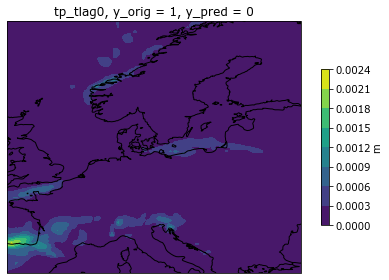

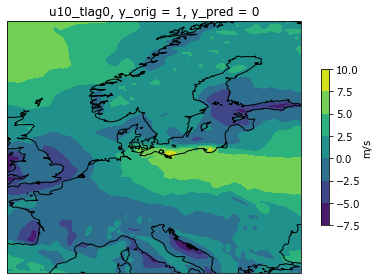

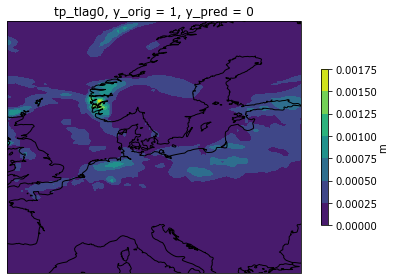

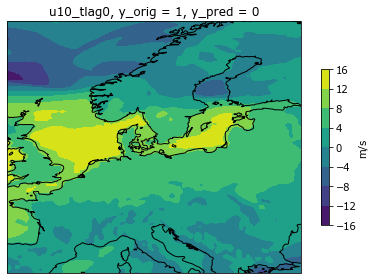

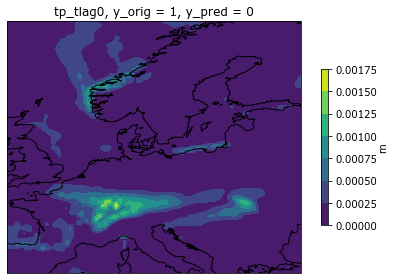

...

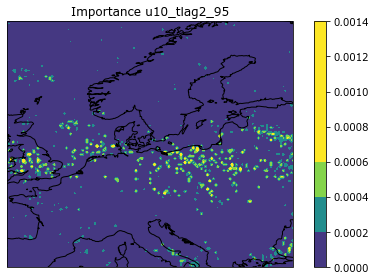

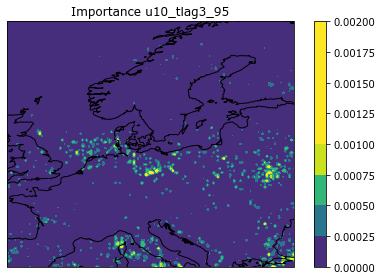

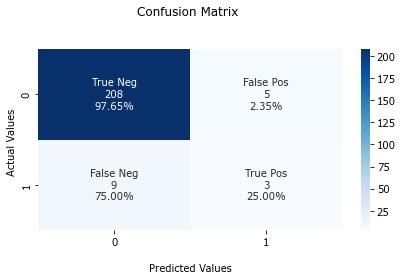

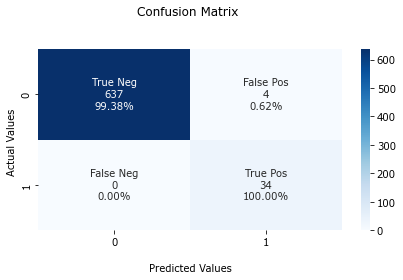

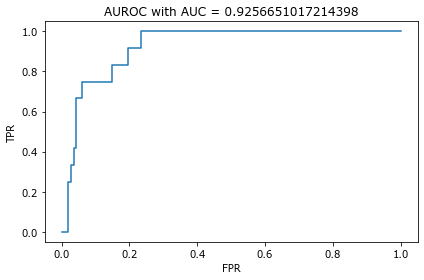

In [8]:
#---
# Load corresponding ERA5-Predictor
#---
import sys
orig_stdout = sys.stdout

run_id = 9
for idx, predictors in enumerate(predictors_of_model): # Loops over separate modelruns 

    #---
    # Save printed output to file
    #---
    folder = f"results/random_forest/{model_run}/"
    saver.directory_existance(folder)
    file_path = f'{folder}output_runid{run_id}.txt'
    sys.stdout = open(file_path, "w") 

    #---
    # Load ERA5- Predictor
    #---
    
    # Initialize
    #---
    timelags = timelags_of_model[idx]
    X = []
    Y = []
    t = []
    pred_units = []
    pred_names = []

    # Main
    #---
    for predictor in predictors:
        print(f"Add predictor {predictor} to model input features")

        # Load data of predictor
        #---
        era5_predictor = data_loader.load_daymean_era5(range_of_years, subregion, season, predictor, preprocess)
        era5_predictor = preprocessing.convert_timestamp(era5_predictor, dim="time")
        X_, Y_, t_ = preprocessing.intersect_time(era5_predictor, gesla_predictand)

        print(f"Introduce timelags: {timelags}")
        
        X_timelag, Y_timelag = preprocessing.combine_timelags(X_, Y_, timelags)

        X.append(X_timelag)
        Y.append(Y_timelag)
        t.append(t_)

        # Save unit and name of predictor
        #---
        for timelag_ in timelags:
            pred_units.append(era5_predictor.units)
            pred_names.append(f"{era5_predictor.name}_tlag{timelag_}")

    # Convert to format needed for model fit
    #---      
    X = np.array(X)
    Y = np.array(Y) 
    Y = Y[0, :] # Assume all timeseries are the same for the predictors.
    t = np.array(t)

    # Reshape for model input
    #---
    print(f"Reshape for model input")

    ndim = Y.shape[0]

    X = X.swapaxes(0, 2) # Put time dimension to front

    print(X.shape) # (time, timelags, predictor_combination, lon?, lat?)

    X = X.reshape(ndim, -1) # Reshapes into (time, timelag1pred1_lonlats:timelag1pred2_lonlats:...:timelag1predn_lonlats:timelag2pred1_lonlats,...:timelagnpredn_lonlats)
    y = Y[:, 0] # Select one station

    #---
    # Handle NaN Values
    #---

    # Insert numerical value that is not in data.
    # ML will hopefully recognize it.
    X[np.where(np.isnan(X))] = -999

    print("Data is prepared as follows")
    print(f"X.shape : {X.shape}")
    print(f"y.shape : {y.shape}")
    print(f"pred_names : {pred_names}")
    print(f"pred_units : {pred_units}")

    #---
    # Apply Train-Test split 
    #---
    print("Apply train-test-split")
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.25)

    #---
    # Detrend train-test sets separately
    #---

    # Convert to expected format 
    #---
    test_index = np.zeros(y_test.shape).astype(int) # All zeros because we only selected one station
    train_index = np.zeros(y_train.shape).astype(int)

    y_test = array_to_series(y_test, test_index, index_name="station", series_name="sea_level") # DONE: Add do module: Preprocessing
    y_train = array_to_series(y_train, train_index, index_name="station", series_name="sea_level")

    # Detrend
    # ---
    print("Detrend train-test data for predictand")
    y_test = gesla_preprocessing.detrend(y_test, level="station")
    y_train = gesla_preprocessing.detrend(y_train, level="station")

    # # Apply one hot encoding
    #---
    y_test = gesla_preprocessing.apply_dummies(y_test, percentile=percentile, level="station")
    print(f"Applied one-hot-encoding to test-set with Percentile: {percentile}")

    y_train = gesla_preprocessing.apply_dummies(y_train, percentile=percentile, level="station")
    print(f"Applied one-hot-encoding to train-set with Percentile: {percentile}")

    print(f"{y_train.size} training datapoints used")
    
    # Convert to DataArray
    # nan values: no measurement at that timestamp for specific station
    #---
    y_test = y_test.to_xarray()
    y_train = y_train.to_xarray()
    
    #---
    # Scale data if they are on different scales
    #---
    if is_scaled:
        print("Scale training data")
        s = StandardScaler()
        s.fit(X_train)
        X_train = s.transform(X_train)
        X_test = s.transform(X_test)

    #---
    #  Optimize Hyperparameters
    #---
    if is_optimized:
        print(f"Optimize Hyperparameters using {optimizer}")
        print(f"Tested Hyperparameters: {hparam_grid}")
        
        hparam_grid_opt = modelfit.optimize_hyperparameter(X_train, y_train, clf(), optimizer, hparam_grid, k, n_iter, n_jobs=-1)
    
    if is_loaded_hparams:
        model_path = models_path[idx]
        with open(model_path, 'rb') as f:
            model = pickle.load(f)

        hparam_grid_opt = model.get_params()
        
    #---
    #  Save hyperparameters
    #---
    folder = f"models/random_forest/{model_run}/" 
    saver.directory_existance(folder)
    saver.save_hpdict(hparam_grid_opt, run_id, model_run, percentile, folder)

    print("Saved Hyperparameters")

    #---
    # Fit the model
    #---
    print(f"Fit model with hyperparameters {hparam_grid_opt}")

    model = clf(**hparam_grid_opt) # One can set parameters afterwards via model.set_params() 

    model.fit(X_train, y_train)

    #---
    # Saving the model
    #---
    print("Save model")
    filename = f'{model_run}_{optimizer}_{run_id}.sav'
    pickle.dump(model, open(f'{folder}{filename}', 'wb'))

    #---
    # Plot Predictor Maps
    #---

    predictor_maps(model, X_test, y_test, lons, lats, pred_units, pred_names, run_id, model_run,) 
    
    #---
    # Evaluate model / Diagnostic
    #--- 
    print("Evaluate Model \n")

    # Score & Importance
    #---
    test_score = model.score(X_test, y_test)
    train_score = model.score(X_train, y_train)
    relative_score = evaluation.relative_scores(train_score, test_score)
    importance = model.feature_importances_

    # Save Scores & Importance
    #---
    folder = f"results/random_forest/{model_run}/"
    saver.directory_existance(folder)

    fname = f"importance_{str(percentile)[-2:]}_{run_id}"
    np.save(f"{folder}{fname}", importance)
    print(f"saved importance to : {folder}{fname}")

    fname = f"testscore_{str(percentile)[-2:]}_{run_id}"
    np.save(f"{folder}{fname}", test_score)
    print(f"saved testscore to : {folder}{fname}")

    fname = f"trainscore_{str(percentile)[-2:]}_{run_id}"
    np.save(f"{folder}{fname}", train_score)
    print(f"saved trainscore to : {folder}{fname}")

    fname = f"relativescore_{str(percentile)[-2:]}_{run_id}"
    np.save(f"{folder}{fname}", relative_score)
    print(f"saved relativescore to : {folder}{fname}")

    # Plot importance of each predictor from combination
    # Goal:
    # 1. Separate importance per predictor
    # 2. Plot importance of each predictor on lon lat map
    #---
    n_pred_features = len(lons) * len(lats) # Features per predictor (lon/lat Input-Field). Needed for importance separation

    predictor_importances = evaluation.separate_predictor_importance(importance, n_pred_features)

    for pred_idx, pred_importance in enumerate(predictor_importances):
        # Plot importance map and save it
        predictor = pred_names[pred_idx] 
        tflag = f"{predictor}_{str(percentile)[-2:]}"

        fig = evaluation.importance_map(pred_importance, lons, lats, tflag)
        
        fname = f"importance_{predictor}_{str(percentile)[-2:]}_{run_id}"
        fig.savefig(f"{folder}{fname}.pdf")

    #---
    # Confusion matrix
    #---
    # Format: 
    # Reality / Model: Negative, Positive
    # Negative    Right Negative, False Positive 
    # Positive    False Negative, Right Positive

    print("Show Confusion Matrix on testdata \n")
    cfm_fig1 = evaluation.plot_cf(model, X_test, y_test)
    cfm_fig1.show()

    print("Show Confusion Matrix on traindata \n")
    cfm_fig2 = evaluation.plot_cf(model, X_train, y_train)
    cfm_fig2.show()

    # Save CFM
    fname = f"{folder}testcf_matrix_{str(percentile)[-2:]}_{run_id}.pdf"
    cfm_fig1.savefig(fname)
    print(f"saved cf matrix to : {fname}")

    fname = f"{folder}traincf_matrix_{str(percentile)[-2:]}_{run_id}.pdf"
    cfm_fig2.savefig(fname)
    print(f"saved cf matrix to : {fname}")

    # Calculate CFM-Metrics
    metrics1 = evaluation.cfm_metrics(model, X_test, y_test)
    metrics2 = evaluation.cfm_metrics(model, X_train, y_train)

    fname = f"testcf_metrics_{str(percentile)[-2:]}_{run_id}.pkl"
    with open(f"{folder}{fname}", 'wb') as f:
        pickle.dump(metrics1, f)

    fname = f"traincf_metrics_{str(percentile)[-2:]}_{run_id}.pkl"
    with open(f"{folder}{fname}", 'wb') as f:
        pickle.dump(metrics2, f)

    print(f"saved cf metrics to : {fname}")

    #---
    # AUROC
    # Receiver Operating Characteristics & Area Under the Curve
    #---

    print("Show AUROC \n")

    y_test_proba = model.predict_proba(X_test)[:, 1] # Prob. for predicting 0 or 1, we only need second col

    fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
    auc = roc_auc_score(y_test, y_test_proba)

    print(f'AUC: {auc}')

    fig, ax = plt.subplots(tight_layout=True)

    ax.plot(fpr, tpr)
    ax.set_xlabel("FPR")
    ax.set_ylabel("TPR")
    ax.set_title(f"AUROC with AUC = {auc}")

    fig.show()

    fname = f"{folder}AUROC_{str(percentile)[-2:]}_{run_id}.pdf"
    fig.savefig(fname)
    print(f"saved AUROC to : {fname}")

    #---
    # Update run_id
    #---
    run_id = run_id + 1
    sys.stdout = orig_stdout # Restore original system output

In [24]:
#---
# Preprocess ERA5-Predictors and adjust GESLA Dataset to timeintervals of ERA5
#---

X = []
Y = []
t = []

predictors = [
    "sp",
    "tp", 
    "u10",
    "v10",
]
timelags = [
    0,
    # 1,
    # 2,
    # 3,
]

pred_units = []
pred_names = []

for predictor in predictors:
    print(f"Add predictor {predictor} to model input features")

    # Load data of predictor
    #---
    era5_predictor = data_loader.load_daymean_era5(range_of_years, subregion, season, predictor, preprocess)
    era5_predictor = preprocessing.convert_timestamp(era5_predictor, dim="time")
    X_, Y_, t_ = preprocessing.intersect_time(era5_predictor, gesla_predictand)

    print(f"Introduce timelags: {timelags}")
    
    X_timelag, Y_timelag = preprocessing.combine_timelags(X_, Y_, timelags)

    X.append(X_timelag)
    Y.append(Y_timelag)
    t.append(t_)

    # Save unit and name of predictor
    #---
    for timelag_ in timelags:
        pred_units.append(era5_predictor.units)
        pred_names.append(f"{era5_predictor.name}_tlag{timelag_}")
        
X = np.array(X)
Y = np.array(Y) 
Y = Y[0, :] # Assume all timeseries are the same for the predictors.
t = np.array(t)

# Reshape for model input
#---
print(f"Reshape for model input")

ndim = Y.shape[0]

X = X.swapaxes(0, 2) # Put time dimension to front

print(X.shape) # (time, timelags, predictor_combination, lon?, lat?)

X = X.reshape(ndim, -1) # Reshapes into (time, timelag1pred1_lonlats:timelag1pred2_lonlats:...:timelag1predn_lonlats:timelag2pred1_lonlats,...:timelagnpredn_lonlats)
y = Y[:, 0] # Select one station

#---
# Handle NaN Values
#---

# Insert numerical value that is not in data.
# ML will hopefully recognize it.
X[np.where(np.isnan(X))] = -999

print("Data is prepared as follows")
print(f"X.shape : {X.shape}")
print(f"y.shape : {y.shape}")
print(f"pred_names : {pred_names}")
print(f"pred_units : {pred_units}")

Add predictor sp to model input features
timeseries is already of dtype datetime64[ns]
Get overlapping timeseries of ERA5 and GESLA
date:2016-01-01 at position [631] was deleted as it was in predictor data but not in predictand data
date:2016-01-02 at position [631] was deleted as it was in predictor data but not in predictand data
date:2016-01-03 at position [631] was deleted as it was in predictor data but not in predictand data
Introduce timelags: [0]
Add predictor tp to model input features
timeseries is already of dtype datetime64[ns]
Get overlapping timeseries of ERA5 and GESLA
date:2016-01-01 at position [631] was deleted as it was in predictor data but not in predictand data
date:2016-01-02 at position [631] was deleted as it was in predictor data but not in predictand data
date:2016-01-03 at position [631] was deleted as it was in predictor data but not in predictand data
Introduce timelags: [0]
Add predictor u10 to model input features
timeseries is already of dtype datetime6

In [2]:
#--- 
# List of modelruns that where promising
# rf001: Using sp only (no timelag)
# rf002: Using sp only (no timelag)
# rf003: No improvement (RandomSearch was used)
# rf004: Best combinations: All predictors or (tp, u10) but rf008 shows, that after scaling no combination works well
# rf005: sp only, timelag of 3 or u10 only, timelag of 3
# rf006: u10 with combined timelags 2 and 3 has highest tpr=80%
#---
best_models = [
    "models/random_forest/rf004/rf004RandomSearchCV_3.sav", # rf004, (tp, u10)
    "models/random_forest/rf005/rf005RandomSearchCV_2.sav", # rf005 (sp timelag3)
    "models/random_forest/rf005/rf005RandomSearchCV_12.sav", # rf005 (u10 timelag3)
    "models/random_forest/rf006/rf006RandomSearchCV_14.sav", # rf006 u10 with timelags 2 and 3
    ]

#---
# Import model
#---
model = loader.load_model(best_models[0])
print(type(model))
print(model)

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
RandomForestClassifier(class_weight='balanced', max_depth=5, min_samples_leaf=4,
                       min_samples_split=5, n_estimators=666, oob_score=True,
                       random_state=0)


In [9]:
#---
# Load data 
#  
#---
# Get timeseries of predictor and predictand
model_run = "rf011"
preprocess = "preprocess1" # ["preprocess1"]
range_of_years = "1999-2008" # ["1999-2008", "2009-2018", "2019-2022",] 
subregion = "lon-0530_lat7040" # ["lon-0530_lat7040"]
season = "winter" # ["winter", "autumn",] 
percentile = 0.95 # [0.95, 0.99,] 
station_names = ["hanko-han-fin-cmems",]

#---
# Preprocess GESLA Data
#---

# Load Predictand
#---
gesla_predictand = data_loader.load_gesla(station_names)

# Select a season
#---
gesla_predictand = gesla_preprocessing.select_season(gesla_predictand, season)

# Select only sea_level analysis data
#---
gesla_predictand = gesla_preprocessing.get_analysis(gesla_predictand)

# Subtract mean of data grouped by station
#---
gesla_predictand = gesla_predictand["sea_level"] # Detrend expects pd.Series
gesla_predictand = gesla_preprocessing.detrend(gesla_predictand, level="station")

# Apply one hot encoding
gesla_predictand = gesla_preprocessing.apply_dummies(gesla_predictand, percentile=percentile, level="station")
print(f"Applied one-hot-encoding with Percentile: {percentile}")

# Convert to DataArray
# nan values: no measurement at that timestamp for specific station
gesla_predictand = gesla_predictand.to_xarray()

Load Predictand from GESLA
Applied one-hot-encoding with Percentile: 0.95


In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.25)

Show Confusion Matrix on testdata 



C:\Users\Kai\AppData\Local\Temp\ipykernel_11588\1561926165.py:9: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  cfm_fig1.show()


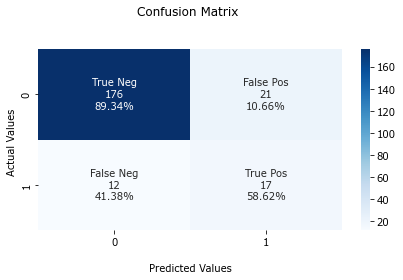

In [12]:
#---
# Evaluate Prediction
#---
folder = "results/random_forest/rf009/"
saver.directory_existance(folder)

print("Show Confusion Matrix on testdata \n")
cfm_fig1 = evaluation.plot_cf(model, X_test, y_test)
cfm_fig1.show()

# # Save CFM
# fname = f"{folder}cf_matrix_{str(percentile)[-2:]}_{run_id}.pdf"
# cfm_fig1.savefig(fname)
# print(f"saved cf matrix to : {fname}")

# # Calculate CFM-Metrics
# metrics1 = evaluation.cfm_metrics(model, X, y)
# print(metrics1)
# fname = f"cf_metrics_{str(percentile)[-2:]}_{run_id}.pkl"
# with open(f"{folder}{fname}", 'wb') as f:
#     pickle.dump(metrics1, f)

In [11]:
# Reshape predictor values into format that is expected by visualisation
#---
lats, lons = preprocessing.get_lonlats(
    range_of_years,
    subregion,
    season,
    predictor,
    preprocess,
)

nlat = len(lats)
nlon = len(lons)
ntime = X.shape[0]
Xpred = X.reshape(ntime, -1, nlat, nlon)

# Check if the reshaping worked
#---
for i, predictor in enumerate(predictors):
    print(f"Add predictor {predictor} to model input features")

    era5_predictor = data_loader.load_daymean_era5(range_of_years, subregion, season, predictor, preprocess)
    era5_predictor = preprocessing.convert_timestamp(era5_predictor, dim="time")
    X_, Y_, t_ = preprocessing.intersect_time(era5_predictor, gesla_predictand)

    print(f"Introduce timelags: {timelags}")
    X_timelag, Y_timelag = preprocessing.combine_timelags(X_, Y_, timelags)
    X_timelag = X_timelag.swapaxes(0, 1)
    print(X_timelag.shape)

    if np.allclose(X_timelag[:, 0, :, :], Xpred[:, i, :, :]):
        print("Reshape worked")
    

Load ERA5-Predictor: u10 in region: lon-0530_lat7040 for years: 2009-2018 in season: winter
Add predictor tp to model input features
timeseries is already of dtype datetime64[ns]
Get overlapping timeseries of ERA5 and GESLA
date:2016-01-01 at position [631] was deleted as it was in predictor data but not in predictand data
date:2016-01-02 at position [631] was deleted as it was in predictor data but not in predictand data
date:2016-01-03 at position [631] was deleted as it was in predictor data but not in predictand data
Introduce timelags: [0]
(899, 1, 121, 141)
Reshape worked
Add predictor u10 to model input features
timeseries is already of dtype datetime64[ns]
Get overlapping timeseries of ERA5 and GESLA
date:2016-01-01 at position [631] was deleted as it was in predictor data but not in predictand data
date:2016-01-02 at position [631] was deleted as it was in predictor data but not in predictand data
date:2016-01-03 at position [631] was deleted as it was in predictor data but no

In [15]:
#---
# Plot Predictor-Map at position where y = 1 and indicate whether y_pred is 0 or 1
#---

#---
# Visualisation
#---

# Create a gif for predictor values within a time range of storm surges
from data import visualisation
import numpy as np

station = 0
subregion = "lon-0530_lat7040"
preprocess = "preprocess1"

lats, lons = preprocessing.get_lonlats(
    range_of_years,
    subregion,
    season,
    predictor,
    preprocess,
)

nlat = len(lats)
nlon = len(lons)
ntime = X.shape[0]
Xpred = X.reshape(ntime, -1, nlat, nlon)
Xpred.shape

Load ERA5-Predictor: u10 in region: lon-0530_lat7040 for years: 1999-2008 in season: winter


(903, 2, 121, 141)

In [1]:
def predictor_map(Xpred_ss, y_ss, ypred_ss, pred_units, pred_names,):
    """
    Description: 
        Plot a predictor map for timepoints of storm surges and indicate whether the prediction is correct or not
    """
    n_time = Xpred_ss.shape[0]
    n_pred = Xpred_ss.shape[1]

    for time in range(n_time):

        is_correct_prediction = (y_ss[time] == ypred_ss[time])

        for pred_idx in range(n_pred):

            # Convert unit of colorbar
            #---
            unit = pred_units[pred_idx]
            if (unit == "m s**-1"): 
                unit = "m/s"

            # Create Figure
            #---
            data = Xpred_ss[time, pred_idx, :, :].flatten() # Predictor data

            tflag = f"{pred_names[pred_idx]}, correct_prediction = {is_correct_prediction}"
            
            fig = visualisation.map(data, lons, lats, tflag=tflag, unit=unit,)

# Predictor Map for each Modelrun

In [ ]:
def load_gesla(station_names, season, percentile,):
    # Load Predictand
    #---
    gesla_predictand = data_loader.load_gesla(station_names)

    # Select a season
    #---
    gesla_predictand = gesla_preprocessing.select_season(gesla_predictand, season)

    # Select only sea_level analysis data
    #---
    gesla_predictand = gesla_preprocessing.get_analysis(gesla_predictand)

    # Subtract mean of data grouped by station
    #---
    gesla_predictand = gesla_predictand["sea_level"] # Detrend expects pd.Series
    gesla_predictand = gesla_preprocessing.detrend(gesla_predictand, level="station")

    # Apply one hot encoding
    gesla_predictand = gesla_preprocessing.apply_dummies(gesla_predictand, percentile=percentile, level="station")
    print(f"Applied one-hot-encoding with Percentile: {percentile}")

    # Convert to DataArray
    # nan values: no measurement at that timestamp for specific station
    gesla_predictand = gesla_predictand.to_xarray()

    return gesla_predictand

In [ ]:
def load_era5(predictors, timelags, range_of_years, subregion, season, preprocess, gesla_predictand):
    """
    Description: 
        Loads timelagged predictor data for a specified range of years, region and season.
        The intersection of predictor and predictand timeseries is taken and data is reshaped to fit the 
        format of scikit learn model.fit().
    Parameters:
        predictors (list): List of predictors
        timelags (list): List of timelags in days
    Returns
        X (np.array): Predictor timeseries, shape (n_labels, n_features)
        y (np.array): Predictand timeseries, shape (n_labels,)
        pred_names (list): List with names of predictors used
        pred_units (list): List with units of predictors
    """
    # Initialize
    #---
    X = []
    Y = []
    t = []
    pred_units = []
    pred_names = []

    # Main
    #---
    for predictor in predictors:
        print(f"Add predictor {predictor} to model input features")

        # Load data of predictor
        #---
        era5_predictor = data_loader.load_daymean_era5(range_of_years, subregion, season, predictor, preprocess)
        era5_predictor = preprocessing.convert_timestamp(era5_predictor, dim="time")
        X_, Y_, t_ = preprocessing.intersect_time(era5_predictor, gesla_predictand)

        print(f"Introduce timelags: {timelags}")
        
        X_timelag, Y_timelag = preprocessing.combine_timelags(X_, Y_, timelags)

        X.append(X_timelag)
        Y.append(Y_timelag)
        t.append(t_)

        # Save unit and name of predictor
        #---
        for timelag_ in timelags:
            pred_units.append(era5_predictor.units)
            pred_names.append(f"{era5_predictor.name}_tlag{timelag_}")
            
    X = np.array(X)
    Y = np.array(Y) 
    Y = Y[0, :] # Assume all timeseries are the same for the predictors.
    t = np.array(t)

    # Reshape for model input
    #---
    print(f"Reshape for model input")

    ndim = Y.shape[0]

    X = X.swapaxes(0, 2) # Put time dimension to front

    print(X.shape) # (time, timelags, predictor_combination, lon?, lat?)

    X = X.reshape(ndim, -1) # Reshapes into (time, timelag1pred1_lonlats:timelag1pred2_lonlats:...:timelag1predn_lonlats:timelag2pred1_lonlats,...:timelagnpredn_lonlats)
    y = Y[:, 0] # Select one station

    #---
    # Handle NaN Values
    #---

    # Insert numerical value that is not in data.
    # ML will hopefully recognize it.
    X[np.where(np.isnan(X))] = -999

    print("Data is prepared as follows")
    print(f"X.shape : {X.shape}")
    print(f"y.shape : {y.shape}")
    print(f"pred_names : {pred_names}")
    print(f"pred_units : {pred_units}")

    return X, y, pred_names, pred_units

In [ ]:
#---
# For each model
#   Load predictor predictand
#   Make prediction
#   Plot predictor map
#---
import os

folder = "models/random_forest/"
model_folders = [f"{f.path}/" for f in os.scandir(folder) if f.is_dir() and "pycache" not in f.path]

#---
# Load Predictand: Same for all models except rf001 - rf003 (percentile 0.99)
#---

# Get timeseries of predictor and predictand
preprocess = "preprocess1" # ["preprocess1"]
range_of_years = "1999-2008" # ["1999-2008", "2009-2018", "2019-2022",] 
subregion = "lon-0530_lat7040" # ["lon-0530_lat7040"]
season = "winter" # ["winter", "autumn",] 
station_names = ["hanko-han-fin-cmems",]
predictors_of_model = [
    # List of lists
    # Predictors of each model run
    # rf001
    #---
    ["sp"], # a
    ["sp"], # b

    # rf002
    #---
    ["sp",], # run_id 0
    ["sp",], # run_id 1
    ["tp",], # run_id 2
    ["tp",], # run_id 3
    ["u10",], # run_id 4
    ["u10",], # run_id 5
    ["v10",], # run_id 6
    ["v10",], # run_id 7

    # rf003
    #---
    ["sp",], # run_id 0
    ["sp",], # run_id 1
    ["tp",], # run_id 2
    ["tp",], # run_id 3
    ["u10",], # run_id 4
    ["u10",], # run_id 5
    ["v10",], # run_id 6
    ["v10",], # run_id 7 

    # rf004
    #---
    ["sp", "u10",], # run_id 0
    ["sp", "tp", "u10",], # run_id 1
    ["sp", "tp",], # run_id 2
    ["tp","u10"], # run_id 3
    ["sp", "tp", "u10", "v10"], # run_id 4

    # rf005
    #---
    ["sp",], ["sp",], ["sp",], ["sp",], ["sp",], # run_id 0-4
    ["tp",], ["tp",], ["tp",], ["tp",], ["tp",], # run_id 5-9
    ["u10",], ["u10",], ["u10",], ["u10",], ["u10",], # run_id 10-14
    ["v10",], ["v10",], ["v10",], ["v10",], ["v10",], # run_id 15-19

    # rf006
    #---
    ["sp"], ["sp",], ["sp",], ["sp",], ["sp",], ["sp",], # run_id 0-5
    ["tp"], ["tp",], ["tp",], ["tp",], ["tp",], ["tp",], # run_id 6-11
    ["u10",], ["u10",], ["u10",], ["u10",], ["u10",], ["u10",], # run_id 12-17
    ["v10",], ["v10",], ["v10",], ["v10",], ["v10",], ["v10",], # run_id 18-23
    ["sp",], # Testrun run_id 24

    # rf007
    #---
    ["sp",], ["sp",], # run_id 0, 1
    ["tp",], ["tp",], # run_id 2, 3
    ["u10",], ["u10",], # run_id 4, 5
    ["v10",], ["v10",], # run_id 6, 7

    # rf008
    #---
    ["sp", "u10",], # run_id 0
    ["sp", "tp", "u10",], # run_id 1
    ["sp", "tp",], # run_id 2
    ["tp","u10"], # run_id 3
    ["sp", "tp", "u10", "v10"], # run_id 4   
]

timelags_of_model = [
    # List of lists
    # Timelags of model run
    # rf001
    #---
    [0,], # a
    [0,], # b

    # rf002
    #---
    [0,], # run_id 0
    [0,], # run_id 1
    [0,], # run_id 2
    [0,], # run_id 3
    [0,], # run_id 4
    [0,], # run_id 5
    [0,], # run_id 6
    [0,], # run_id 7 

    # rf003
    #---
    [0,], # run_id 0
    [0,], # run_id 1
    [0,], # run_id 2
    [0,], # run_id 3
    [0,], # run_id 4
    [0,], # run_id 5
    [0,], # run_id 6
    [0,], # run_id 7 

    # rf004
    #---
    [0,], # run_id 0
    [0,], # run_id 1
    [0,], # run_id 2
    [0,], # run_id 3
    [0,], # run_id 4

    # rf005
    #---
    [1,], [2,], [3,], [5,], [7,], # run_id 0-4
    [1,], [2,], [3,], [5,], [7,], # run_id 5-9
    [1,], [2,], [3,], [5,], [7,], # run_id 10-14
    [1,], [2,], [3,], [5,], [7,], # run_id 15-19

    # rf006
    #---
    [0, 2, 7,], [1, 3,], [2, 3,], [3, 4,], [2, 4, 6,], [2, 3, 4, 5,], # run_id 0-5
    [0, 2, 7,], [1, 3,], [2, 3,], [3, 4,], [2, 4, 6,], [2, 3, 4, 5,], # run_id 6-11
    [0, 2, 7,], [1, 3,], [2, 3,], [3, 4,], [2, 4, 6,], [2, 3, 4, 5,], # run_id 12-17
    [0, 2, 7,], [1, 3,], [2, 3,], [3, 4,], [2, 4, 6,], [2, 3, 4, 5,], # run_id 18-23
    [1, 1,], # Testrun run_id 24

    # rf007
    #---
    [0,], [0,], # run_id 0, 1
    [0,], [0,], # run_id 2, 3
    [0,], [0,], # run_id 4, 5
    [0,], [0,], # run_id 6, 7

    # rf008
    #---
    [0,], # run_id 0
    [0,], # run_id 1
    [0,], # run_id 2
    [0,], # run_id 3
    [0,], # run_id 4
]

lats, lons = preprocessing.get_lonlats(
range_of_years,
subregion,
season,
predictor="sp",
era5_import="preprocess1",
)
nlat = len(lats)
nlon = len(lons)

Load ERA5-Predictor: sp in region: lon-0530_lat7040 for years: 1999-2008 in season: winter


rf001
1
2
rf002
3
4
5
6
7
8
9
10
rf003
11
12
13
14
15
16
17
18
rf004
19
20
21
22
23
rf005
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
Load model from models/random_forest/rf006/rf006RandomSearchCV_0.sav
Load Predictand from GESLA
Applied one-hot-encoding with Percentile: 0.95
Add predictor sp to model input features
timeseries is already of dtype datetime64[ns]
Get overlapping timeseries of ERA5 and GESLA
Introduce timelags: [0, 2, 7]
Reshape for model input
(896, 3, 1, 121, 141)
Data is prepared as follows
X.shape : (896, 51183)
y.shape : (896,)
pred_names : ['sp_tlag0', 'sp_tlag2', 'sp_tlag7']
pred_units : ['Pa', 'Pa', 'Pa']


d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\data\visualisation.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(tight_layout=True,)


Load model from models/random_forest/rf006/rf006RandomSearchCV_1.sav
Load Predictand from GESLA
Applied one-hot-encoding with Percentile: 0.95
Add predictor sp to model input features
timeseries is already of dtype datetime64[ns]
Get overlapping timeseries of ERA5 and GESLA
Introduce timelags: [1, 3]
Reshape for model input
(900, 2, 1, 121, 141)
Data is prepared as follows
X.shape : (900, 34122)
y.shape : (900,)
pred_names : ['sp_tlag1', 'sp_tlag3']
pred_units : ['Pa', 'Pa']
Load model from models/random_forest/rf006/rf006RandomSearchCV_2.sav
Load Predictand from GESLA
Applied one-hot-encoding with Percentile: 0.95
Add predictor sp to model input features
timeseries is already of dtype datetime64[ns]
Get overlapping timeseries of ERA5 and GESLA
Introduce timelags: [2, 3]
Reshape for model input
(900, 2, 1, 121, 141)
Data is prepared as follows
X.shape : (900, 34122)
y.shape : (900,)
pred_names : ['sp_tlag2', 'sp_tlag3']
pred_units : ['Pa', 'Pa']
Load model from models/random_forest/rf0

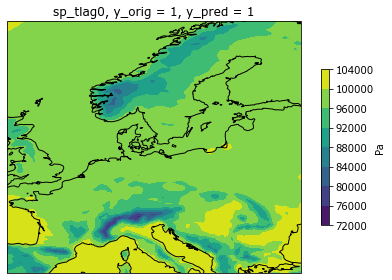

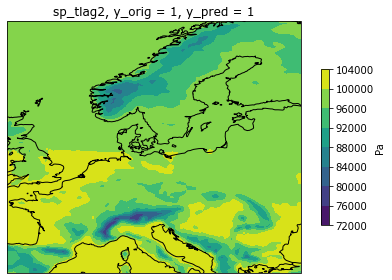

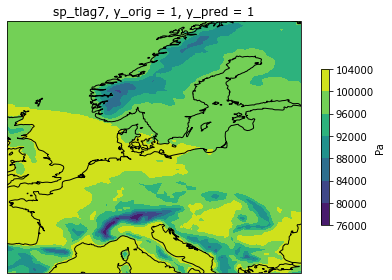

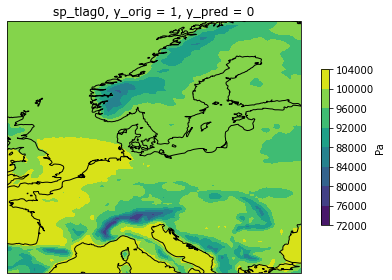

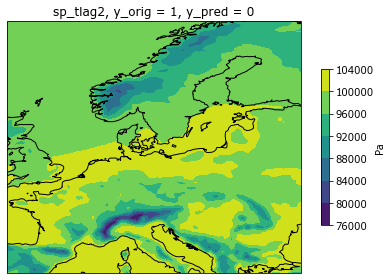

...

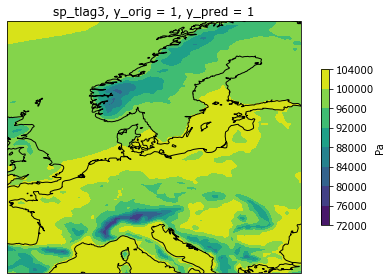

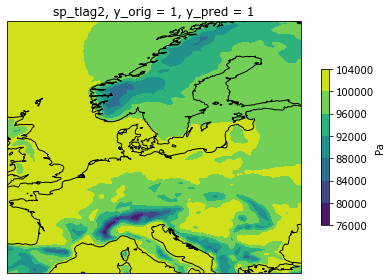

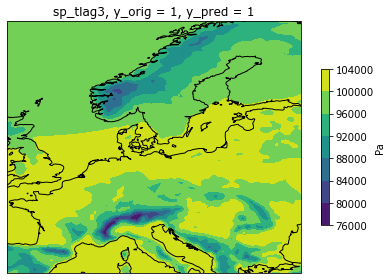

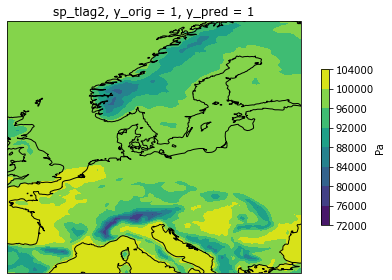

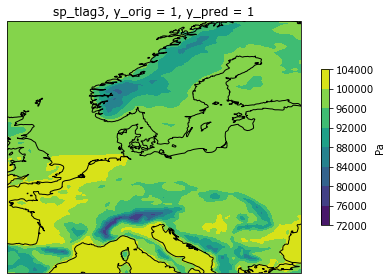

In [ ]:
#---
# Loop Models
#---
run_idx = 0 # Tracking the overall index of this run to call correct predictors and timelags
for folder in model_folders:
    model_run = folder[-6:-1]
    model_path = [f for f in os.listdir(folder) if f.endswith('.sav')]

    #---
    # Sort modelpath according to the run_id
    #--
    if int(model_run[-3:]) >= 5: # Order for all modelruns larger than rf005. Other runs had not more than 10 runs.
        order = []
        for model_path_ in model_path:
            order_idx = int(model_path_.split(".")[0].split("_")[-1]) # Get the run_id of that path.
            order.append(order_idx)

        model_path = [x for _,x in sorted(zip(order, model_path))] # Sorted model_path
        
        #---
        # Main
        #---
        sub_run_id = 0 # Tracking run_ids of each model_run, e.g. rf004_run_id 1 etc in order to save map correctly
        for model_path_ in model_path:       
            #---
            # Load Model
            #---
            print(f"Load model from {folder}{model_path_}")
            model = loader.load_model(f"{folder}{model_path_}")

            #---
            # Load Predictand
            #---

            # Get right percentile if 0.99 was used
            percentile = 0.95 
            if "rf001" in folder:
                if "_b.sav" in model_path_:
                    percentile = 0.99
            if "rf002" in folder:
                if int(model_path_[-5]) % 2 != 0:
                    percentile = 0.99
            if "rf003" in folder:
                percentile = int(model_path_[-6:-4]) / 100 # Percentile is part of naming convention for rf003

            gesla_predictand = load_gesla(station_names, season, percentile,)
            
            #---
            # Load corresponding ERA5-Predictor
            #---
            predictors = predictors_of_model[run_idx]
            timelags = timelags_of_model[run_idx]

            X, y, pred_names, pred_units = load_era5(predictors, timelags, range_of_years, subregion, season, preprocess, gesla_predictand)
            
            X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.25)
            
            #---
            # Make a prediction
            #---
            y_test_pred = model.predict(X_test) # Predicted data

            #---
            # Select data for plotting original storm surge events
            #---
            ss_idx = np.where(y_test == 1) # Timepoints of storm surges in original data

            y_test_ss = y_test[ss_idx] # Original data storm surges only
            y_pred_ss = y_test_pred[ss_idx] # Predictions at timepoints of SS in original data

            ntime = X_test.shape[0]
            X_pred = X_test.reshape(ntime, -1, nlat, nlon) # Reshape to fit format for plotting predictor values on a map

            X_pred_plot = X_pred[ss_idx] # Select only predictor values at timepoints of storm surges

            #---
            # Plot & Save predictor map at original storm surge events
            #---
            n_time = X_pred_plot.shape[0]
            n_pred = X_pred_plot.shape[1]

            time_idx = 0
            for time in range(n_time):

                is_correct_prediction = (y_test_ss[time] == y_pred_ss[time])

                for pred_idx in range(n_pred):

                    # Convert unit of colorbar
                    #---
                    unit = pred_units[pred_idx]
                    if (unit == "m s**-1"): 
                        unit = "m/s"

                    # Create Figure
                    #---
                    data = X_pred_plot[time, pred_idx, :, :].flatten() # Predictor data

                    if is_correct_prediction:
                        tflag = f"{pred_names[pred_idx]}, y_orig = 1, y_pred = 1"
                        fname = f"{pred_names[pred_idx]}_{time_idx}_istrue_{sub_run_id}"
                    else:
                        tflag = f"{pred_names[pred_idx]}, y_orig = 1, y_pred = 0" 
                        fname = f"{pred_names[pred_idx]}_{time_idx}_isfalse_{sub_run_id}"
                    
                    fig = visualisation.map(data, lons, lats, tflag=tflag, unit=unit,)

                    folder1 = f"results/random_forest/{model_run}/predictor_maps/"
                    saver.directory_existance(folder1)

                    fig.savefig(f"{folder1}{fname}.pdf")

                time_idx = time_idx + 1

            #---
            # Plot & Save predictor map of predicted storm surge events where original data has no storm surge 
            #---
            idx2 = np.where(y_test_pred == 1) # Select all occurences where prediction has SS
            y_test_idx2 = y_test[idx2]
            X_pred_plot = X_pred[idx2]
            idx3 = np.where(y_test_idx2 == 0) # Subselect all occurences where prediction has SS and original data has no SS
            X_pred_plot = X_pred_plot[idx3] # Choose this selection as a plot
            n_time = X_pred_plot.shape[0]
            n_pred = X_pred_plot.shape[1]

            for time in range(n_time):
                for pred_idx in range(n_pred):

                    # Convert unit of colorbar
                    #---
                    unit = pred_units[pred_idx]
                    if (unit == "m s**-1"): 
                        unit = "m/s"

                    # Create Figure
                    #---
                    data = X_pred_plot[time, pred_idx, :, :].flatten() # Predictor data

                    tflag = f"{pred_names[pred_idx]},  y_orig = 0, y_pred = 1"
                    
                    fig = visualisation.map(data, lons, lats, tflag=tflag, unit=unit,)
                    
                    folder1 = f"results/random_forest/{model_run}/predictor_maps/"
                    saver.directory_existance(folder1)

                    fname = f"{pred_names[pred_idx]}_{time_idx}_predss_{sub_run_id}"

                    fig.savefig(f"{folder1}{fname}.pdf")

                time_idx = time_idx + 1
            sub_run_id = sub_run_id + 1
            run_idx = run_idx + 1


In [ ]:
#---
# Implement the plotting of predictor map in new model runs seemlessly
# Make sure that it still works to plot the importance map
#---

# Save Models of rf001, rf002 as .sav

In [19]:
def rf001_run(predictor="sp", percentile=0.95): 
    """
    Description:
        Reruns model run rf001 up to building the model. Ends with saving the model as .sav.
    """
    #---
    #  Modules
    #---
    print("Import Modules\n")
    import numpy as np
    from data import preprocessing

    #---
    # Initialize
    #---
    model_run = "rf001"
    folder = f"results/random_forest/{model_run}/" # Where to save results
    optimizer = "GridSearchCV"
    if percentile == 0.95:
        run_id = "a"
    else:
        run_id = "b"
    saver.directory_existance(folder)

    # ---
    # Preprocessing
    # ---

    # Get timeseries of predictor and predictand
    season = "winter"
    
    # Description of data
    print("Description \n")
    print("Model: Random Forest")
    print("Predictand: Classification (0,1)")
    print(f"Percentile Predictand: {percentile}")
    print(f"Predictors: {predictor} ")
    print(f"Seaon: {season}")
    print("Preprocessing / Region: preprocessing1, only one station selected")

    print("Start Preprocessing of Data\n\n")

    X, Y, t = preprocessing.preprocessing1(season, predictor, percentile)

    # Handle NaN values: 
    # Insert numerical value that is not in data.
    # ML will hopefully recognize it.
    X[np.where(np.isnan(X))] = -999

    # Save number of lat/lon for interpreting model output later
    ndim = X.shape[0]
    nlat = X.shape[1]
    nlon = X.shape[2]

    # Prepare shape for model
    X = X.reshape(ndim, -1) # (ndim, nclasses)
    y = Y[:, 0] # Select only one station

    #---
    # Train Model
    #---
    print("Start model training\n")
    from sklearn.model_selection import train_test_split
    from sklearn.ensemble import RandomForestClassifier

    # Train-Test Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.25)

    # Setup Model

    model = RandomForestClassifier(criterion='gini',
    n_estimators=91, #- nTrees 
    max_depth=9, 
    random_state=0, # To compare results when changing hyperparameters
    class_weight="balanced",
    oob_score=True,
    )

    model.fit(X_train, y_train)
    #---
    # Saving the model
    #---
    folder = f"models/random_forest/{model_run}/" 
    saver.directory_existance(folder)

    print("Save model")
    filename = f'{model_run}_{optimizer}_{run_id}.sav'
    pickle.dump(model, open(f'{folder}{filename}', 'wb'))

    print("End of Model run")


In [22]:
#---
# Save Model rf001 as .sav
#---
rf001_run(percentile=0.99)


Import Modules

Description 

Model: Random Forest
Predictand: Classification (0,1)
Percentile Predictand: 0.99
Predictors: sp 
Seaon: winter
Preprocessing / Region: preprocessing1, only one station selected
Start Preprocessing of Data


Load ERA5-Predictor: sp in region: lon-0530_lat7040 for years: 1999-2008 in season: winter
Load Predictand from GESLA
Applied one-hot-encoding
Get overlapping timeseries of ERA5 and GESLA
Start model training

Save model
End of Model run


In [26]:
#---
# rf002
#---
def rf002_run(run_id, predictor="sp", percentile=0.95,): 
    #---
    #  Modules
    #---
    print("Import Modules\n")
    import numpy as np
    from data import preprocessing

    #---
    # Initialize
    #---
    model_run = "rf002"
    folder = f"results/random_forest/{model_run}/" # Where to save results
    saver.directory_existance(folder)
    season = "winter"

    # ---
    # Preprocessing
    # ---

    # Get timeseries of predictor and predictand
    # Description of data
    print("Description \n")
    print("Model: Random Forest")
    print("Predictand: Classification (0,1)")
    print(f"Percentile Predictand: {percentile}")
    print(f"Predictors: {predictor} ")
    print(f"Seaon: {season}")
    print("Preprocessing / Region: preprocessing1, only one station selected")

    print("Start Preprocessing of Data\n\n")

    X, Y, t = preprocessing.preprocessing1(season, predictor, percentile)

    # Handle NaN values: 
    # Insert numerical value that is not in data.
    # ML will hopefully recognize it.
    X[np.where(np.isnan(X))] = -999

    # Save number of lat/lon for interpreting model output later
    ndim = X.shape[0]
    nlat = X.shape[1]
    nlon = X.shape[2]

    # Prepare shape for model
    X = X.reshape(ndim, -1) # (ndim, nclasses)
    y = Y[:, 0] # Select only one station

    #---
    # Train Model
    #---
    print("Start model training\n")
    from sklearn.model_selection import train_test_split
    from sklearn.ensemble import RandomForestClassifier

    # Train-Test Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.25)

    # Load Hyperparameters
    import pickle
    folder = f"models/random_forest/{model_run}/"
    saver.directory_existance(folder)

    fname = f"{model_run}_{predictor}{str(percentile)[-2:]}.pkl"

    with open(f"{folder}{fname}", 'rb') as f:
        params = pickle.load(f)

    # Fit the model
    model = RandomForestClassifier(criterion='gini',
    n_estimators=params["n_estimators"], #- nTrees 
    max_depth=params["max_depth"], 
    min_samples_leaf=params["min_samples_leaf"],
    min_samples_split=params["min_samples_split"],
    random_state=0, # To compare results when changing hyperparameters
    class_weight="balanced",
    oob_score=True,
    )

    model.fit(X_train, y_train)

    #---
    # Saving the model
    #---
    optimizer = "ValidationCurves"
    print("Save model")
    filename = f'{model_run}_{optimizer}_{run_id}.sav'
    pickle.dump(model, open(f'{folder}{filename}', 'wb'))

In [28]:
predictors = ["sp", "tp", "u10", "v10", ]
percentiles = [0.95, 0.99]
run_id = 0
for predictor in predictors:
    for percentile in percentiles:
        print(f"Start Model for: \n Predictor: {predictor}, percentile: {percentile}")
        print(f"Run_id: {run_id}")
        rf002_run(run_id, predictor, percentile)

        run_id = run_id + 1

Start Model for: 
 Predictor: sp, percentile: 0.95
Run_id: 0
Import Modules

Description 

Model: Random Forest
Predictand: Classification (0,1)
Percentile Predictand: 0.95
Predictors: sp 
Seaon: winter
Preprocessing / Region: preprocessing1, only one station selected
Start Preprocessing of Data


Load ERA5-Predictor: sp in region: lon-0530_lat7040 for years: 1999-2008 in season: winter
Load Predictand from GESLA
Applied one-hot-encoding
Get overlapping timeseries of ERA5 and GESLA
Start model training

Save model
Start Model for: 
 Predictor: sp, percentile: 0.99
Run_id: 1
Import Modules

Description 

Model: Random Forest
Predictand: Classification (0,1)
Percentile Predictand: 0.99
Predictors: sp 
Seaon: winter
Preprocessing / Region: preprocessing1, only one station selected
Start Preprocessing of Data


Load ERA5-Predictor: sp in region: lon-0530_lat7040 for years: 1999-2008 in season: winter
Load Predictand from GESLA
Applied one-hot-encoding
Get overlapping timeseries of ERA5 and

In [42]:
def map(data, lons, lats, tflag="", vmin=None, vmax=None, unit=None, is_clb_label=True):
    """
    Description:
        Plots predictor-data on a lat-lon map.
    Parameters:
        data (np.array): dataset from predictors. Shape:(lat, lon).flatten()
        lons (np.array): Longitudes of predictor data
        lats (np.array): Latitudes of predictor data
        tflag (str): Additional Title information, (Defaults: "")
        vmin (float): Minimum value for colorbar, (Defaults: None)
        vmax (float): Maximum value for colorbar, (Defaults: None)
        unit (str): Unit of data
        is_clb_label (bool): Whether to label the colorbar with unit or not.
    Returns:
        fig: Figure of data
    """
    # Modules
    import matplotlib.pyplot as plt 
    import cartopy.crs as ccrs
    import numpy as np

    # Reshape data to lat/lon
    nlat = len(lats)
    nlon = len(lons)
    data = data.reshape(nlat, nlon)

    # Plot data on lat/lon map
    fig = plt.figure(tight_layout=True,)
    ax = plt.axes(projection=ccrs.PlateCarree())

    plot = ax.contourf(lons, lats, data, 
    transform=ccrs.PlateCarree(),
    vmin=vmin,
    vmax=vmax,
    )

    ax.coastlines()

    if vmin == None or vmax == None:
        cbarticks = None
    else:
        cbarticks = np.arange(vmin, vmax, (vmax-vmin) / 5) # 5 ticks

    clb = plt.colorbar(plot, shrink=.62, ticks=cbarticks)

    if is_clb_label:
        clb.set_label(f"{unit}", rotation=270)

    ax.set_title(f"{tflag}")

    return fig

In [ ]:

figures = []
vmin = np.min(Xpred)
vmax = np.max(Xpred)

for t1 in np.arange(50, 90, 1):
    x = X[t1, :, :].flatten()
    fig = visualisation.map(x, lons, lats, tflag=f"{predictor}, t = {t1}, sts = {Y[t1, station]}", vmin=vmin, vmax=vmax,)
    # fig.canvas.draw()       # draw the canvas, cache the renderer
    # image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    # image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

    figures.append(fig)

# # Create a gif
# path = f"./{predictor}"
# visualisation.create_gif(figures, path, fps=1)

In [ ]:
#---
# IMPORTANT TO KNOW.
# Check how np.reshape flattens the array
#---
arr = np.random.random((3,2,2,3,4)) # (time, timelag, pred, lon?, lat?)
flat_arr = arr.reshape(3, -1)

print(arr)
print(arr.shape)
print(arr[1, 1, 1, :, :])
print(flat_arr[0, 0:12]) # First flattened lon lat values, e.g first timelag, first predictor
print(flat_arr[0, 12:24]) # Second flattened lon lat, e.g. first timelag, second predictor
print(flat_arr[0, 24:36]) # Third, e.g. second timelag, first predictor
print(flat_arr[1, 36:48])


[[[[[6.30346320e-01 8.87075075e-01 5.92364535e-01 6.90815878e-01]
    [6.70947643e-01 1.34226635e-02 4.67200984e-01 5.58050967e-01]
    [6.14475675e-04 4.79518084e-01 8.37976738e-01 9.37026858e-01]]

   [[1.67908196e-01 5.22825354e-01 4.15334102e-01 9.04240062e-01]
    [4.43848803e-01 4.49547396e-01 1.44400046e-02 3.45535069e-01]
    [1.36589633e-01 1.06135960e-01 6.92002319e-01 1.61738268e-01]]]


  [[[4.36834334e-01 6.94431033e-01 8.27496791e-01 2.31805335e-01]
    [2.71197110e-01 5.02637438e-01 2.65473376e-01 5.94617616e-01]
    [6.03974367e-01 7.28811243e-01 1.64128757e-01 3.06205497e-01]]

   [[7.31446910e-01 6.99555840e-01 8.02583325e-01 3.20935309e-01]
    [6.20563000e-01 9.25573683e-01 8.89674979e-01 9.07130204e-01]
    [7.24836036e-01 6.01569663e-01 3.72535270e-01 3.69909625e-01]]]]



 [[[[9.69916879e-01 1.14399448e-01 4.43277381e-01 4.51991268e-01]
    [7.24941031e-01 2.09741520e-01 2.25735371e-01 5.67297339e-01]
    [4.39424606e-01 5.83410224e-02 8.44201375e-01 9.59157871e-

In [ ]:
# Score & Importance
#---
test_score = model.score(X_test, y_test)
train_score = model.score(X_train, y_train)
relative_score = evaluation.relative_scores(train_score, test_score)
importance = model.feature_importances_

# Save Scores & Importance
#---
folder = f"results/random_forest/{model_run}/"
saver.directory_existance(folder)

fname = f"importance_{str(percentile)[-2:]}_{run_id}"
np.save(f"{folder}{fname}", importance)
print(f"saved importance to : {folder}{fname}")

fname = f"testscore_{str(percentile)[-2:]}_{run_id}"
np.save(f"{folder}{fname}", test_score)
print(f"saved testscore to : {folder}{fname}")

fname = f"trainscore_{str(percentile)[-2:]}_{run_id}"
np.save(f"{folder}{fname}", train_score)
print(f"saved trainscore to : {folder}{fname}")

fname = f"relativescore_{str(percentile)[-2:]}_{run_id}"
np.save(f"{folder}{fname}", relative_score)
print(f"saved relativescore to : {folder}{fname}")

# Plot importance of each predictor from combination
# Goal:
# 1. Separate importance per predictor
# 2. Plot importance of each predictor on lon lat map
#---
# Get lat,lons of this model run
lats, lons = preprocessing.get_lonlats(
    range_of_years,
    subregion,
    season,
    predictor="sp", # Does not matter which predictor. All predictors are sampled on same lon-lat field.
    era5_import=preprocess,
)
n_pred_features = len(lons) * len(lats) # Features per predictor (lon/lat Input-Field). Needed for importance separation

predictor_importances = evaluation.separate_predictor_importance(importance, n_pred_features)

for pred_idx, pred_importance in enumerate(predictor_importances):
    # Plot importance map and save it
    predictor = predictors[pred_idx]
    tflag = f"{predictor}_{str(percentile)[-2:]}"

    fig = evaluation.importance_map(pred_importance, lons, lats, tflag)
    
    fname = f"importance_{predictor}_{str(percentile)[-2:]}_{run_id}"
    fig.savefig(f"{folder}{fname}.pdf")
    
# Confusion matrix
#---
# Format: 
# Reality / Model: Negative, Positive
# Negative    Right Negative, False Positive 
# Positive    False Negative, Right Positive

print("Show Confusion Matrix on testdata \n")
cfm_fig1 = evaluation.plot_cf(model, X_test, y_test)
cfm_fig1.show()

print("Show Confusion Matrix on traindata \n")
cfm_fig2 = evaluation.plot_cf(model, X_train, y_train)
cfm_fig2.show()

# Save CFM
fname = f"{folder}testcf_matrix_{str(percentile)[-2:]}_{run_id}.pdf"
cfm_fig1.savefig(fname)
print(f"saved cf matrix to : {fname}")

fname = f"{folder}traincf_matrix_{str(percentile)[-2:]}_{run_id}.pdf"
cfm_fig2.savefig(fname)
print(f"saved cf matrix to : {fname}")

# Calculate CFM-Metrics
metrics1 = evaluation.cfm_metrics(model, X_test, y_test)
metrics2 = evaluation.cfm_metrics(model, X_train, y_train)

fname = f"testcf_metrics_{str(percentile)[-2:]}_{run_id}.pkl"
with open(f"{folder}{fname}", 'wb') as f:
    pickle.dump(metrics1, f)

fname = f"traincf_metrics_{str(percentile)[-2:]}_{run_id}.pkl"
with open(f"{folder}{fname}", 'wb') as f:
    pickle.dump(metrics2, f)

print(f"saved cf metrics to : {fname}")


# AUROC
# Receiver Operating Characteristics & Area Under the Curve
#---

print("Show AUROC \n")

y_test_proba = model.predict_proba(X_test)[:, 1] # Prob. for predicting 0 or 1, we only need second col

fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
auc = roc_auc_score(y_test, y_test_proba)

print(f'AUC: {auc}')

fig, ax = plt.subplots(tight_layout=True)

ax.plot(fpr, tpr)
ax.set_xlabel("FPR")
ax.set_ylabel("TPR")
ax.set_title(f"AUROC with AUC = {auc}")

fig.show()

fname = f"{folder}AUROC_{str(percentile)[-2:]}_{run_id}.pdf"
fig.savefig(fname)
print(f"saved AUROC to : {fname}")

In [74]:
#---
# Check out GESLA Dataset timepoints
# GESLA Dataset only goes until 2020 and only December of that year is covered
#---
predictand_time = pd.to_datetime(gesla_predictand.date_time.values).date
year_idx = gesla_predictand.date_time.groupby("date_time.year").groups
month_idx = gesla_predictand.date_time.groupby("date_time.month").groups
print(f"Years in GESLA Dataset: {year_idx.keys()}")
print(f"Month in GESLA Dataset: {month_idx.keys()}")

# Check if certain month is in dataset for a specific year
#---
sel_month = month_idx[1]
sel_year = year_idx[2020]
inters = np.intersect1d(sel_month, sel_year) # If inters is empty, no data of that month in indicated year is in dataset
inters.shape

Years in GESLA Dataset: dict_keys([1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020])
Month in GESLA Dataset: dict_keys([1, 2, 12])


(0,)

In [137]:
def convert_timestamp(da, dim):
    """
    Description: 
        Converts timepoint to datetime64 type
    Parameters:
        da (DataArray): DataArray with timeseries
        dim (str): Flag of time dimension
    Return:
        da (DataArray): DataArray with converted timestamp values
    """
    # Ensure correct dtype of timestamp
    #---
    if da[dim].dtype == "float64":
        print(f"convert timestamp from dtype: {da[dim].dtype} to datetime64")
        era5_timeflag = "T11:30:00.000000000" # Timeflag of ERA5
        t = da[dim].values 
        t_datetime = preprocessing.float64_to_datetime64(t, era5_timeflag) # Convert datatype 
        coords_to_replace = {"time" : t_datetime} 
        da = preprocessing.replace_coords(da, coords_to_replace) # Replace dimension values with new datatype
        
    if "datetime64" in str(era5_predictor["time"].dtype):
        print(f"timeseries is already of dtype {da[dim].dtype}")

    return da

In [129]:
def aggregate_dimension(da, dim):
    """
    Description:
        Aggregate (mean) along a dimension of a dataset. 
    Parameters:
        da (DataArray): xr.DataArray 
        dim (str): Dimension along which mean is taken
    Return:
        aggregated_da
    """
    aggregated_da = da.mean(dim=dim)
    
    return aggregated_da

In [8]:
#---
# Convert np.float64 to np.Datetime64
#---
def float64_to_datetime64(t, timeflag=""):
    """
    Description: 
        Converts dates of type float64, e.g. (yyyymmdd.0) into datetime64 format.
    Parameters:
        t (np.array, float64): Values of timeseries to be converted
        timeflag (str): Timeflag of specific hours of measurement, e.g. T11:30:00.000000000.
    Returns:
        t_datetime (np.array, np.datetime64): Converted values of timeseries
    """
    #- Modules
    import numpy as np

    #- Init
    t_datetime = []

    #- Main
    for timepoint in t: 
        timepoint = str(int(timepoint))
        yyyy = timepoint[:4]
        mm = timepoint[4:6]
        dd = timepoint[6:8]
        new_date = np.datetime64(f"{yyyy}-{mm}-{dd}{timeflag}")
        t_datetime.append(new_date)

    t_datetime = np.array(t_datetime)

    return t_datetime

In [9]:
#---
# Update DataArray with timepoints
#---
def replace_coords(da, coords_to_replace):
    """
    Description:
        Replaces indicated dimensions (keys) in dims_to_replace with corresponding values.
        Leaves name of dimension unchanged.
    Parameters:
        da (xr.DataArray): DataArray with coordinates and values to replace
        coords_to_replace (dict): Dictionary with coordinates as keys and new values to replace old ones with.
    Returns:
        da (xr.DataArray): DataArray with updated coordinate values
    """
    for coord, values in coords_to_replace.items():
        da.coords[coord] = values
        
    return da

In [77]:
gesla_predictand.sel(date_time=gesla_predictand.date_time.dt.year.isin([2016]))
# gesla_predictand.sel(time=gesla_predictand.date_time.dt.month.isin([6, 7, 8]))

<xarray.DataArray 'sea_level' (station: 1, date_time: 2105)>
array([[0., 0., 0., ..., 0., 0., 0.]])
Coordinates:
  * station    (station) int64 0
  * date_time  (date_time) datetime64[ns] 2016-01-04T06:00:00 ... 2016-12-31T...

Load Predictand from GESLA
Applied one-hot-encoding with Percentile: 0.95
Add predictor sp to model input features
Get overlapping timeseries of ERA5 and GESLA
Add predictor u10 to model input features
Get overlapping timeseries of ERA5 and GESLA
Assert that timeinterval of all predictors are the same
Time-interval is the same
Time-interval is the same
All Time-intervals are the same
Prepare input data for model training
Data is prepared as follows
X.shape : (903, 34122)
y.shape : (903,)
Start Model Training
Do Train-Test-Split
Scale training data
Optimize Hyperparameters using RandomSearchCV
Tested Hyperparameters: {'n_estimators': [0, 111, 222, 333, 444, 555, 666, 777, 888, 1000], 'max_depth': [5, 17, 30, 42, 55, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'criterion': ['gini'], 'random_state': [0], 'class_weight': ['balanced'], 'oob_score': [True]}
Optimize Hyperparameters using RandomSearchCV
Fitting 3 folds for each of 100 candidates, totalling 300 fits


d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
30 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\ensemble\_forest.py", line 392, in fit
    self._validate_estimator()
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\ensemble\_base.py", line 138, in _validate_estimator
    raise ValueError(
Va

Created directory: models/random_forest/rf008/
File saved to: models/random_forest/rf008/rf008_095.pkl
Saved Hyperparameters
Fit model with hyperparameters {'random_state': 0, 'oob_score': True, 'n_estimators': 222, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 17, 'criterion': 'gini', 'class_weight': 'balanced'}
Save model
Evaluate Model 

Evaluate Model 

testscore: 0.8761061946902655
trainscore: 0.9970457902511078
train/test: 1.1380421646300523
Possible overfit
Created directory: results/random_forest/rf008/
saved importance to : results/random_forest/rf008/importance_95_0
saved testscore to : results/random_forest/rf008/testscore_95_0
saved trainscore to : results/random_forest/rf008/trainscore_95_0
saved relativescore to : results/random_forest/rf008/relativescore_95_0
Load ERA5-Predictor: sp in region: lon-0530_lat7040 for years: 1999-2008 in season: winter
Show Confusion Matrix on testdata 



d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:289: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  cfm_fig1.show()
d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:293: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  cfm_fig2.show()


Show Confusion Matrix on traindata 

saved cf matrix to : results/random_forest/rf008/testcf_matrix_95_0.pdf
saved cf matrix to : results/random_forest/rf008/traincf_matrix_95_0.pdf
Metric values 

tnr: 0.9543147208121827
tpr: 0.3448275862068966
gmean: 0.573649755215997
wacc: 0.6495711535095396
precision: 0.5263157894736842
recall: 0.3448275862068966
fmeasure: 0.4166666666666667
Metric values 

tnr: 0.9965753424657534
tpr: 1.0
gmean: 0.9982862026822535
wacc: 0.9982876712328768
precision: 0.9789473684210527
recall: 1.0
fmeasure: 0.9893617021276596
saved cf metrics to : traincf_metrics_95_0.pkl
Show AUROC 

AUC: 0.9081043234727814
saved AUROC to : results/random_forest/rf008/AUROC_95_0.pdf
Load Predictand from GESLA


d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:339: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Applied one-hot-encoding with Percentile: 0.95
Add predictor sp to model input features
Get overlapping timeseries of ERA5 and GESLA
Add predictor tp to model input features
Get overlapping timeseries of ERA5 and GESLA
Add predictor u10 to model input features
Get overlapping timeseries of ERA5 and GESLA
Assert that timeinterval of all predictors are the same
Time-interval is the same
Time-interval is the same
Time-interval is the same
All Time-intervals are the same
Prepare input data for model training
Data is prepared as follows
X.shape : (903, 51183)
y.shape : (903,)
Start Model Training
Do Train-Test-Split
Scale training data
Optimize Hyperparameters using RandomSearchCV
Tested Hyperparameters: {'n_estimators': [0, 111, 222, 333, 444, 555, 666, 777, 888, 1000], 'max_depth': [5, 17, 30, 42, 55, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'criterion': ['gini'], 'random_state': [0], 'class_weight': ['balanced'], 'oob_score': [True]}
Optimize Hyperparameters

d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
30 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\ensemble\_forest.py", line 392, in fit
    self._validate_estimator()
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\ensemble\_base.py", line 138, in _validate_estimator
    raise ValueError(
Va

File saved to: models/random_forest/rf008/rf008_195.pkl
Saved Hyperparameters
Fit model with hyperparameters {'random_state': 0, 'oob_score': True, 'n_estimators': 222, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_depth': None, 'criterion': 'gini', 'class_weight': 'balanced'}
Save model
Evaluate Model 

Evaluate Model 

testscore: 0.8982300884955752
trainscore: 1.0
train/test: 1.1133004926108374
Possible overfit
saved importance to : results/random_forest/rf008/importance_95_1
saved testscore to : results/random_forest/rf008/testscore_95_1
saved trainscore to : results/random_forest/rf008/trainscore_95_1
saved relativescore to : results/random_forest/rf008/relativescore_95_1
Load ERA5-Predictor: sp in region: lon-0530_lat7040 for years: 1999-2008 in season: winter
Show Confusion Matrix on testdata 

Show Confusion Matrix on traindata 



d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:289: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  cfm_fig1.show()
d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:293: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  cfm_fig2.show()


saved cf matrix to : results/random_forest/rf008/testcf_matrix_95_1.pdf
saved cf matrix to : results/random_forest/rf008/traincf_matrix_95_1.pdf
Metric values 

tnr: 0.9644670050761421
tpr: 0.4482758620689655
gmean: 0.6575311993643959
wacc: 0.7063714335725538
precision: 0.65
recall: 0.4482758620689655
fmeasure: 0.5306122448979592
Metric values 

tnr: 1.0
tpr: 1.0
gmean: 1.0
wacc: 1.0
precision: 1.0
recall: 1.0
fmeasure: 1.0
saved cf metrics to : traincf_metrics_95_1.pkl
Show AUROC 

AUC: 0.896026605986347
saved AUROC to : results/random_forest/rf008/AUROC_95_1.pdf


d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:339: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Load Predictand from GESLA
Applied one-hot-encoding with Percentile: 0.95
Add predictor sp to model input features
Get overlapping timeseries of ERA5 and GESLA
Add predictor tp to model input features
Get overlapping timeseries of ERA5 and GESLA
Assert that timeinterval of all predictors are the same
Time-interval is the same
Time-interval is the same
All Time-intervals are the same
Prepare input data for model training
Data is prepared as follows
X.shape : (903, 34122)
y.shape : (903,)
Start Model Training
Do Train-Test-Split
Scale training data
Optimize Hyperparameters using RandomSearchCV
Tested Hyperparameters: {'n_estimators': [0, 111, 222, 333, 444, 555, 666, 777, 888, 1000], 'max_depth': [5, 17, 30, 42, 55, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'criterion': ['gini'], 'random_state': [0], 'class_weight': ['balanced'], 'oob_score': [True]}
Optimize Hyperparameters using RandomSearchCV
Fitting 3 folds for each of 100 candidates, totalling 300 fits


d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
30 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\ensemble\_forest.py", line 392, in fit
    self._validate_estimator()
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\ensemble\_base.py", line 138, in _validate_estimator
    raise ValueError(
Va

File saved to: models/random_forest/rf008/rf008_295.pkl
Saved Hyperparameters
Fit model with hyperparameters {'random_state': 0, 'oob_score': True, 'n_estimators': 333, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_depth': 30, 'criterion': 'gini', 'class_weight': 'balanced'}
Save model
Evaluate Model 

Evaluate Model 

testscore: 0.8761061946902655
trainscore: 1.0
train/test: 1.1414141414141414
Possible overfit
saved importance to : results/random_forest/rf008/importance_95_2
saved testscore to : results/random_forest/rf008/testscore_95_2
saved trainscore to : results/random_forest/rf008/trainscore_95_2
saved relativescore to : results/random_forest/rf008/relativescore_95_2
Load ERA5-Predictor: sp in region: lon-0530_lat7040 for years: 1999-2008 in season: winter
Show Confusion Matrix on testdata 

Show Confusion Matrix on traindata 



d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:289: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  cfm_fig1.show()
d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:293: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  cfm_fig2.show()


saved cf matrix to : results/random_forest/rf008/testcf_matrix_95_2.pdf
saved cf matrix to : results/random_forest/rf008/traincf_matrix_95_2.pdf
Metric values 

tnr: 0.9441624365482234
tpr: 0.41379310344827586
gmean: 0.6250503217970336
wacc: 0.6789777699982497
precision: 0.5217391304347826
recall: 0.41379310344827586
fmeasure: 0.4615384615384615
Metric values 

tnr: 1.0
tpr: 1.0
gmean: 1.0
wacc: 1.0
precision: 1.0
recall: 1.0
fmeasure: 1.0
saved cf metrics to : traincf_metrics_95_2.pkl
Show AUROC 

AUC: 0.8820234552774374


d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:339: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


saved AUROC to : results/random_forest/rf008/AUROC_95_2.pdf
Load Predictand from GESLA
Applied one-hot-encoding with Percentile: 0.95
Add predictor tp to model input features
Get overlapping timeseries of ERA5 and GESLA
Add predictor u10 to model input features
Get overlapping timeseries of ERA5 and GESLA
Assert that timeinterval of all predictors are the same
Time-interval is the same
Time-interval is the same
All Time-intervals are the same
Prepare input data for model training
Data is prepared as follows
X.shape : (903, 34122)
y.shape : (903,)
Start Model Training
Do Train-Test-Split
Scale training data
Optimize Hyperparameters using RandomSearchCV
Tested Hyperparameters: {'n_estimators': [0, 111, 222, 333, 444, 555, 666, 777, 888, 1000], 'max_depth': [5, 17, 30, 42, 55, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'criterion': ['gini'], 'random_state': [0], 'class_weight': ['balanced'], 'oob_score': [True]}
Optimize Hyperparameters using RandomSearchCV
Fit

d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
30 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\ensemble\_forest.py", line 392, in fit
    self._validate_estimator()
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\ensemble\_base.py", line 138, in _validate_estimator
    raise ValueError(
Va

File saved to: models/random_forest/rf008/rf008_395.pkl
Saved Hyperparameters
Fit model with hyperparameters {'random_state': 0, 'oob_score': True, 'n_estimators': 888, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 17, 'criterion': 'gini', 'class_weight': 'balanced'}
Save model
Evaluate Model 

Evaluate Model 

testscore: 0.8805309734513275
trainscore: 1.0
train/test: 1.135678391959799
Possible overfit
saved importance to : results/random_forest/rf008/importance_95_3
saved testscore to : results/random_forest/rf008/testscore_95_3
saved trainscore to : results/random_forest/rf008/trainscore_95_3
saved relativescore to : results/random_forest/rf008/relativescore_95_3
Load ERA5-Predictor: sp in region: lon-0530_lat7040 for years: 1999-2008 in season: winter
Show Confusion Matrix on testdata 



d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:289: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  cfm_fig1.show()


Show Confusion Matrix on traindata 



d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:293: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  cfm_fig2.show()


saved cf matrix to : results/random_forest/rf008/testcf_matrix_95_3.pdf
saved cf matrix to : results/random_forest/rf008/traincf_matrix_95_3.pdf
Metric values 

tnr: 0.9695431472081218
tpr: 0.27586206896551724
gmean: 0.5171655233483489
wacc: 0.6227026080868195
precision: 0.5714285714285714
recall: 0.27586206896551724
fmeasure: 0.37209302325581395
Metric values 

tnr: 1.0
tpr: 1.0
gmean: 1.0
wacc: 1.0
precision: 1.0
recall: 1.0
fmeasure: 1.0
saved cf metrics to : traincf_metrics_95_3.pkl
Show AUROC 

AUC: 0.873271486084369


d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:332: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(tight_layout=True)
d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:339: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


saved AUROC to : results/random_forest/rf008/AUROC_95_3.pdf
Load Predictand from GESLA
Applied one-hot-encoding with Percentile: 0.95
Add predictor sp to model input features
Get overlapping timeseries of ERA5 and GESLA
Add predictor tp to model input features
Get overlapping timeseries of ERA5 and GESLA
Add predictor u10 to model input features
Get overlapping timeseries of ERA5 and GESLA
Add predictor v10 to model input features
Get overlapping timeseries of ERA5 and GESLA
Assert that timeinterval of all predictors are the same
Time-interval is the same
Time-interval is the same
Time-interval is the same
Time-interval is the same
All Time-intervals are the same
Prepare input data for model training
Data is prepared as follows
X.shape : (903, 68244)
y.shape : (903,)
Start Model Training
Do Train-Test-Split
Scale training data
Optimize Hyperparameters using RandomSearchCV
Tested Hyperparameters: {'n_estimators': [0, 111, 222, 333, 444, 555, 666, 777, 888, 1000], 'max_depth': [5, 17, 30

d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
30 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\ensemble\_forest.py", line 392, in fit
    self._validate_estimator()
  File "d:\Programme\miniconda3\envs\mlpy38\lib\site-packages\sklearn\ensemble\_base.py", line 138, in _validate_estimator
    raise ValueError(
Va

File saved to: models/random_forest/rf008/rf008_495.pkl
Saved Hyperparameters
Fit model with hyperparameters {'random_state': 0, 'oob_score': True, 'n_estimators': 888, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 30, 'criterion': 'gini', 'class_weight': 'balanced'}
Save model
Evaluate Model 

Evaluate Model 

testscore: 0.9026548672566371
trainscore: 0.9940915805022157
train/test: 1.1012975352622587
Possible overfit
saved importance to : results/random_forest/rf008/importance_95_4
saved testscore to : results/random_forest/rf008/testscore_95_4
saved trainscore to : results/random_forest/rf008/trainscore_95_4
saved relativescore to : results/random_forest/rf008/relativescore_95_4
Load ERA5-Predictor: sp in region: lon-0530_lat7040 for years: 1999-2008 in season: winter
Show Confusion Matrix on testdata 



d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:289: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  cfm_fig1.show()


Show Confusion Matrix on traindata 



d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:293: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  cfm_fig2.show()


saved cf matrix to : results/random_forest/rf008/testcf_matrix_95_4.pdf
saved cf matrix to : results/random_forest/rf008/traincf_matrix_95_4.pdf
Metric values 

tnr: 0.9543147208121827
tpr: 0.5517241379310345
gmean: 0.7256159222722427
wacc: 0.7530194293716086
precision: 0.64
recall: 0.5517241379310345
fmeasure: 0.5925925925925927
Metric values 

tnr: 0.9931506849315068
tpr: 1.0
gmean: 0.9965694581570854
wacc: 0.9965753424657534
precision: 0.9587628865979382
recall: 1.0
fmeasure: 0.9789473684210526
saved cf metrics to : traincf_metrics_95_4.pkl
Show AUROC 

AUC: 0.9028531419569403


d:\OneDrive\Alle_Ordner\Coding\Python\master_thesis\models\random_forest\rf008.py:339: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


saved AUROC to : results/random_forest/rf008/AUROC_95_4.pdf


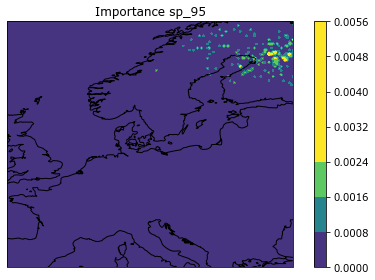

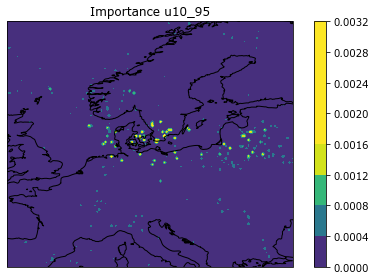

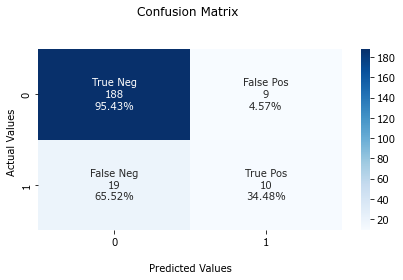

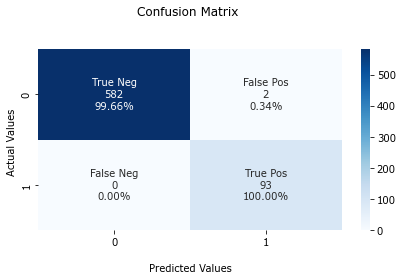

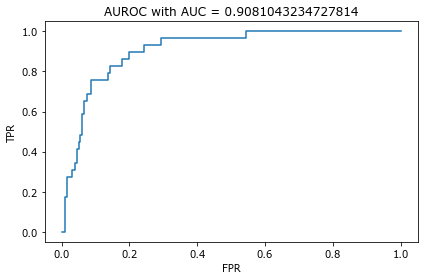

...

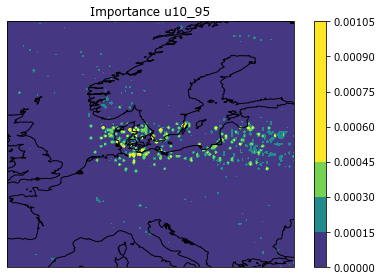

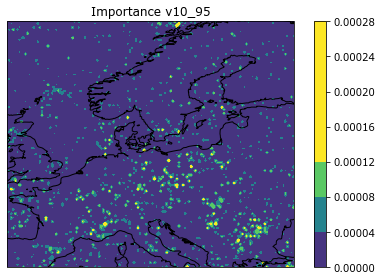

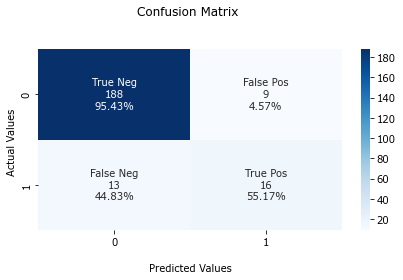

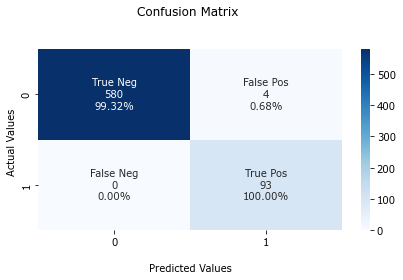

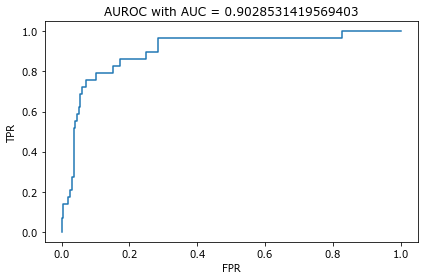

In [4]:
#---
# Initialize
#---
from models.random_forest import rf008
from sklearn.ensemble import RandomForestClassifier
import numpy as np

model_run = "rf008"
season = "winter" # ["winter", "autumn",] 
percentile = 0.95 # [0.95, 0.99,] 
station_names = ["hanko-han-fin-cmems",]
preds = [
    ["sp", "u10",], # run_id 0
    ["sp", "tp", "u10",], # run_id 1,...
    ["sp", "tp",],
    ["tp","u10"],
    ["sp", "tp", "u10", "v10"],
]

clf = RandomForestClassifier
optimizer = "RandomSearchCV" #["RandomSearchCV", "GridSearchCV"]
n_iter = 100 
k = 3
#---
# Build Hyperparameter Grid to optimize from.
# For this run, use exactly the same as in rf004 to see if 
# scaling of predictor data leads to any changes.
#---
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 0, stop = 1000, num = 10)]

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 55, num = 5)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
hparam_grid = {'n_estimators': n_estimators, # hparam grid if optimization is needed
            'max_depth': max_depth,
            'min_samples_split': min_samples_split,
            'min_samples_leaf': min_samples_leaf,
            'criterion' : ['gini',],
            'random_state' : [0,], # To compare results when changing hyperparameters
            'class_weight' : ["balanced",],
            'oob_score' : [True,],
            }

for run_id, predictors in enumerate(preds):
    rf008.run(season, predictors, percentile, station_names, 
    clf, hparam_grid, optimizer, 
    run_id, model_run, 
    k, n_iter, is_optimized=True, is_scaled=True)